### Libraries

In [1]:
import os, sys, time, random
import numpy as np
import pandas as pd
import cv2, torch
from tqdm.auto import tqdm
import shutil as sh

from IPython.display import Image, clear_output
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 9.6 MB/s eta 0:00:00


## Download the Dataset

In [3]:
!kaggle datasets download -d sshikamaru/car-object-detection

Dataset URL: https://www.kaggle.com/datasets/sshikamaru/car-object-detection
License(s): other
 95% 106M/112M [00:01<00:00, 101MB/s]  
100% 112M/112M [00:01<00:00, 80.8MB/s]


### Unzip it

In [4]:
!unzip car-object-detection.zip

Archive:  car-object-detection.zip
  inflating: data/sample_submission.csv  
  inflating: data/testing_images/vid_5_25100.jpg  
  inflating: data/testing_images/vid_5_25120.jpg  
  inflating: data/testing_images/vid_5_25140.jpg  
  inflating: data/testing_images/vid_5_25160.jpg  
  inflating: data/testing_images/vid_5_25180.jpg  
  inflating: data/testing_images/vid_5_25200.jpg  
  inflating: data/testing_images/vid_5_25220.jpg  
  inflating: data/testing_images/vid_5_25240.jpg  
  inflating: data/testing_images/vid_5_25260.jpg  
  inflating: data/testing_images/vid_5_26320.jpg  
  inflating: data/testing_images/vid_5_26400.jpg  
  inflating: data/testing_images/vid_5_26420.jpg  
  inflating: data/testing_images/vid_5_26560.jpg  
  inflating: data/testing_images/vid_5_26580.jpg  
  inflating: data/testing_images/vid_5_26600.jpg  
  inflating: data/testing_images/vid_5_26620.jpg  
  inflating: data/testing_images/vid_5_26640.jpg  
  inflating: data/testing_images/vid_5_26660.jpg  
  inf

## Loading Data 📝 / Preprocessing ⚙️

In [5]:
img_h, img_w, num_channels = (380, 676, 3)
df = pd.read_csv('data/train_solution_bounding_boxes (1).csv')
df.rename(columns={'image':'image_id'}, inplace=True)
df['image_id'] = df['image_id'].apply(lambda x: x.split('.')[0])
df['x_center'] = (df['xmin'] + df['xmax'])/2
df['y_center'] = (df['ymin'] + df['ymax'])/2
df['w'] = df['xmax'] - df['xmin']
df['h'] = df['ymax'] - df['ymin']
df['classes'] = 0
df['x_center'] = df['x_center']/img_w
df['w'] = df['w']/img_w
df['y_center'] = df['y_center']/img_h
df['h'] = df['h']/img_h
df.head()

,image_id,xmin,ymin,xmax,ymax,x_center,y_center,w,h,classes
0,vid_4_1000,281.259045,187.035071,327.727931,223.225547,0.450434,0.539817,0.068741,0.095238,0
1,vid_4_10000,15.163531,187.035071,120.329957,236.430180,0.100217,0.557191,0.155572,0.129987,0
2,vid_4_10040,239.192475,176.764801,361.968162,236.430180,0.444645,0.543678,0.181621,0.157014,0
3,vid_4_10020,496.483358,172.363256,630.020260,231.539575,0.833213,0.531451,0.197540,0.155727,0
4,vid_4_10060,16.630970,186.546010,132.558611,238.386422,0.110347,0.559122,0.171491,0.136422,0


In [6]:
index = list(set(df.image_id))
image = random.choice(index)
print("Image ID: %s"%(image))
img = cv2.imread(f'data/training_images/{image}.jpg')
img.shape

Image ID: vid_4_9500


(380, 676, 3)

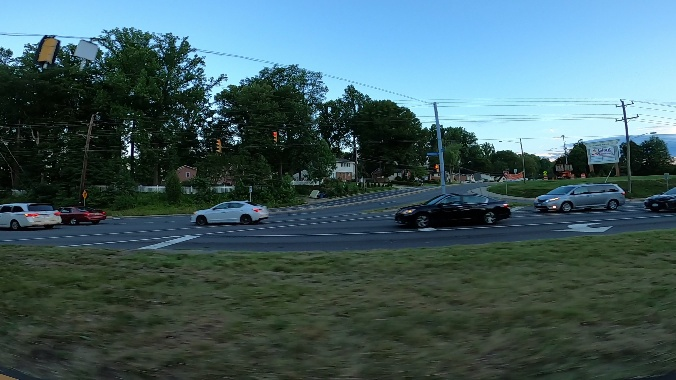

In [7]:
image = random.choice(index)
Image(filename=f'data/training_images/{image}.jpg',width=600)

## Training

## Directory setup for training

In [8]:
source = 'training_images'
val_size = 5
if True:
    val_index = index[0:len(index)//val_size]
    for name,mini in tqdm(df.groupby('image_id')):
        if name in val_index:
            path2save = 'datasets/validation/'
        else:
            path2save = 'datasets/training/'
        if not os.path.exists(path2save+"labels/"):
            os.makedirs(path2save+"labels/")
        with open(path2save+'labels/'+name+".txt", 'w+') as f:
            row = mini[['classes','x_center','y_center','w','h']].astype(float).values
            row = row.astype(str)
            for j in range(len(row)):
                text = ' '.join(row[j])
                f.write(text)
                f.write("\n")
        if not os.path.exists(path2save+'images/'):
            os.makedirs(path2save+'images/')
        sh.copy("data/{}/{}.jpg".format(source,name),'{}images/{}.jpg'.format(path2save,name))

  0%|          | 0/355 [00:00<?, ?it/s]

## Delete Data folder

In [ ]:
# !rm -rf data

In [10]:
with open("ds.yaml", 'w') as f:
    f.write("""train: training/images
val: validation/images

# Classes
nc: 1
names: ['car']""")

## Training

In [11]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 81.2MB/s]


In [12]:
# Train the model
train_results = model.train(
    data="ds.yaml",  # path to dataset YAML
    epochs=10,  # number of training epochs
    imgsz=640,  # training image size

)

Ultralytics 8.3.11 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=ds.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=N

100%|██████████| 755k/755k [00:00<00:00, 20.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/datasets/training/labels... 284 images, 0 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<00:00, 1528.76it/s]


train: New cache created: /content/datasets/training/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/validation/labels... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<00:00, 966.90it/s]

val: New cache created: /content/datasets/validation/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.46G      1.542      3.481      1.197         15        640: 100%|██████████| 18/18 [00:08<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.06it/s]

                   all         71        101     0.0046       0.97      0.815      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.37G      1.377      2.062      1.142         22        640: 100%|██████████| 18/18 [00:04<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.99it/s]

                   all         71        101    0.00455       0.96       0.64      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.37G      1.326      1.838      1.143         20        640: 100%|██████████| 18/18 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all         71        101    0.00474          1       0.41      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.36G      1.308      1.672      1.137         22        640: 100%|██████████| 18/18 [00:05<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.50it/s]

                   all         71        101          1      0.326      0.931      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.36G      1.312      1.653      1.183         16        640: 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.60it/s]

                   all         71        101      0.955      0.836      0.962       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.38G      1.312      1.518      1.154         18        640: 100%|██████████| 18/18 [00:06<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.62it/s]

                   all         71        101       0.88      0.653      0.798      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.38G      1.283      1.401      1.143         16        640: 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.37it/s]

                   all         71        101      0.964       0.95      0.983      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.36G      1.229        1.3      1.118         20        640: 100%|██████████| 18/18 [00:05<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]

                   all         71        101       0.96      0.949      0.984      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.36G      1.211      1.256        1.1         22        640: 100%|██████████| 18/18 [00:05<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.97it/s]

                   all         71        101      0.969       0.99      0.989      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.36G      1.169      1.195      1.096         26        640: 100%|██████████| 18/18 [00:04<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.25it/s]

                   all         71        101      0.961      0.988      0.983      0.677



10 epochs completed in 0.022 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.11 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


                   all         71        101      0.968       0.99      0.989      0.678
Speed: 0.1ms preprocess, 2.9ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/train


## Prediction

In [13]:

# # Evaluate model performance on the validation set
# metrics = model.val()

# # Perform object detection on an image
# results = model("datasets/validation/images/vid_4_10020.jpg")
# results[0].show()

# # Export the model to ONNX format
# path = model.export(format="onnx")  # return path to exported model

Ultralytics 8.3.11 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (5.2 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0', 'onnxslim==0.1.34', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.3/140.3 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 301.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.2/226.2 MB 321.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 171.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 235.1 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 17.1s, installed 3 packages: ['onnx>=1.12.0', 'onnxslim==0.1.34', 'onnxruntime-gpu']
requirements: ⚠️ Restart runtime or rerun 

In [19]:
import imageio

# Load the trained YOLO model
model = YOLO('runs/detect/train/weights/best.pt')

In [40]:
# Path to the validation images folder
val_images_folder = 'datasets/validation/images'

# Create a list to store the predicted images
predicted_images = []

# Loop over the validation images
for filename in os.listdir(val_images_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(val_images_folder, filename)

        # Perform object detection
        results = model(image_path)

        # Get the predicted image with bounding boxes
        # This might be slightly inaccurate, but try the following:
        # annotated_image = results[0]
        # predicted_images.append(annotated_image)

        # # Instead of the above 2 lines, try this:
        results[0].save('runs/detect/predict_gif.jpg')

        predicted_images.append(imageio.imread("runs/detect/predict_gif.jpg"))


# Create a GIF from the predicted images
imageio.mimsave('predicted_objects.gif', predicted_images, fps=2)  # Adjust fps as needed


image 1/1 /content/datasets/validation/images/vid_4_3460.jpg: 384x640 1 car, 20.1ms
Speed: 4.1ms preprocess, 20.1ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/datasets/validation/images/vid_4_9540.jpg: 384x640 2 cars, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/datasets/validation/images/vid_4_21520.jpg: 384x640 1 car, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/datasets/validation/images/vid_4_9820.jpg: 384x640 1 car, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/datasets/validation/images/vid_4_2380.jpg: 384x640 1 car, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/datasets/validation/images/vid_4_12200.jpg: 384x640 2 cars, 12.3ms
S

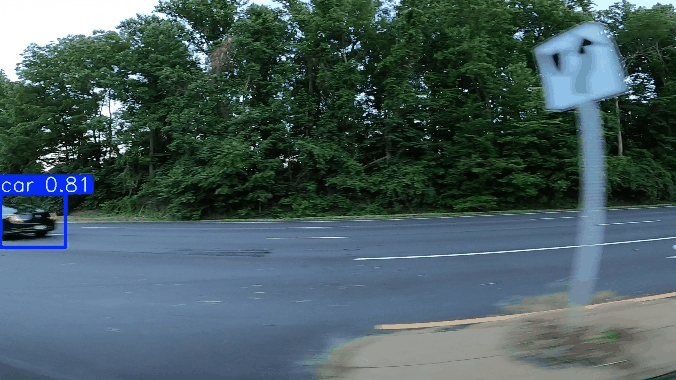

In [41]:
Image("predicted_objects.gif")